In [1]:
from h5glance import H5Glance

import os
import sys
import h5py
import math
import numpy  as np
import pandas as pd

from scipy    import stats
from datetime import datetime, timezone

from lgdo import LH5Store #If this fails, try pip install legend-pydataobj
import lgdo.lh5_store as lh5

import matplotlib.pyplot as plt

from legendmeta import LegendMetadata
#from pygama.flow import DataLoader

from scipy import stats as st

In [3]:
repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/')
sys.path.append(repository_path)

import peak_functions as pf
import fit_functions  as fitf

In [4]:
lmeta = LegendMetadata('/Users/romoluque_c/Repositories/legend-metadata/')
dt    = datetime(2023, 4, 22, 5, 54, 22, tzinfo=timezone.utc)
chmap = lmeta.hardware.configuration.channelmaps.on(dt)

In [6]:
data_path = "/Users/romoluque_c/LEGEND/BSM_LEGEND/low_energy/data_p06/waveforms/"
wf_file   = data_path + "l200-p06-r006-tst-20230725T090913Z.lh5"

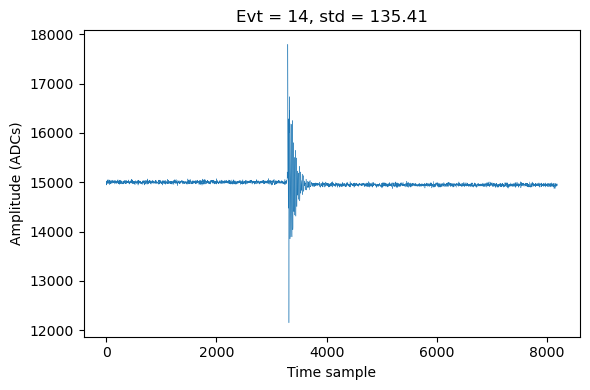

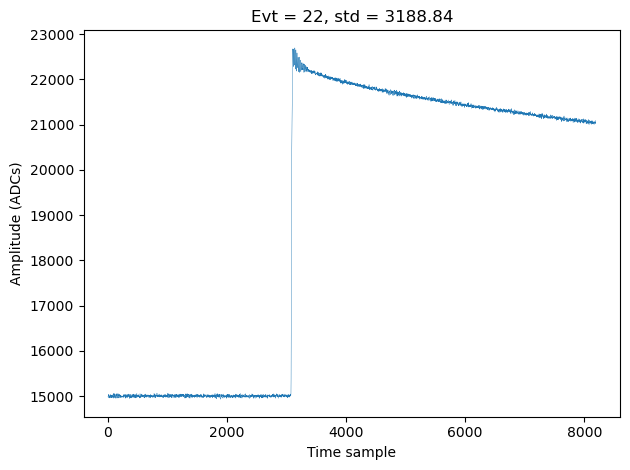

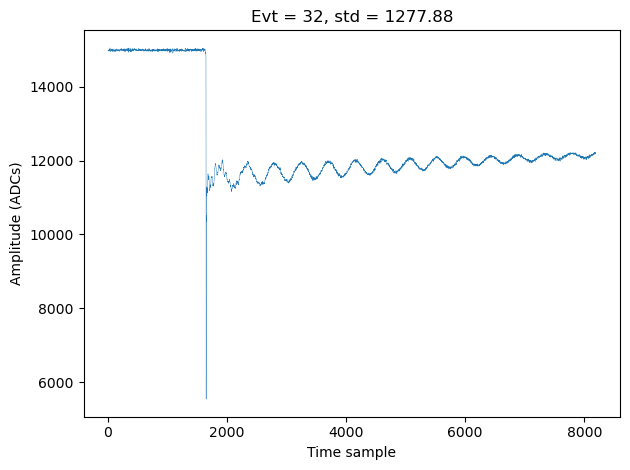

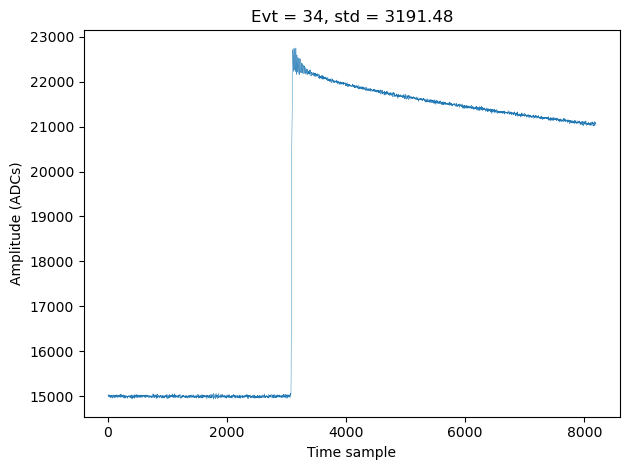

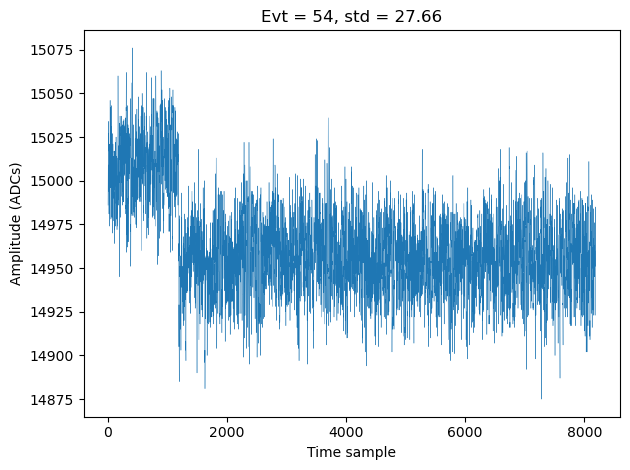

...

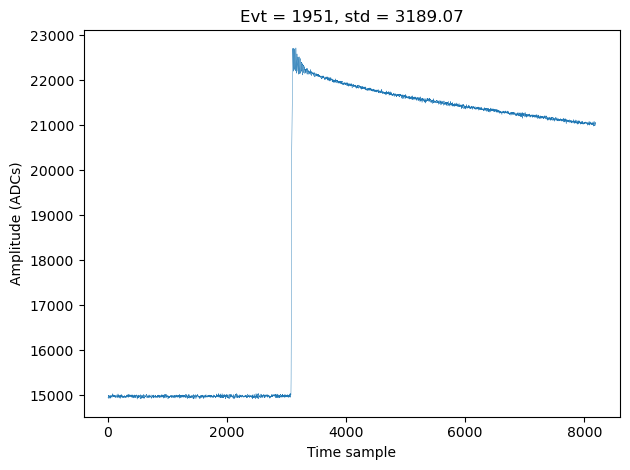

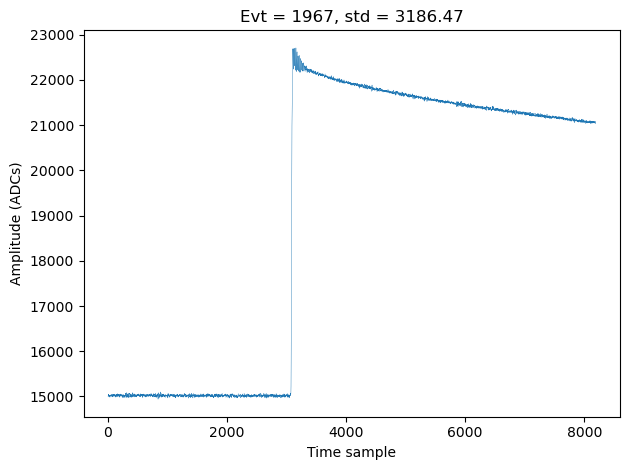

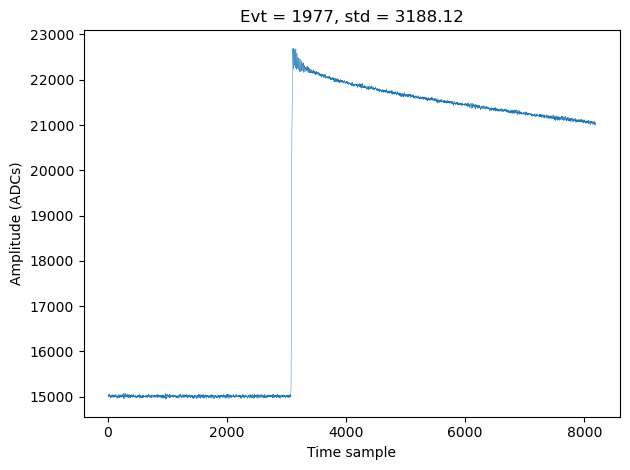

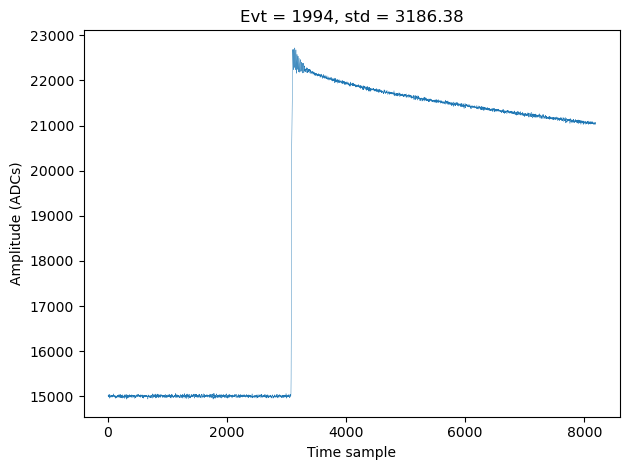

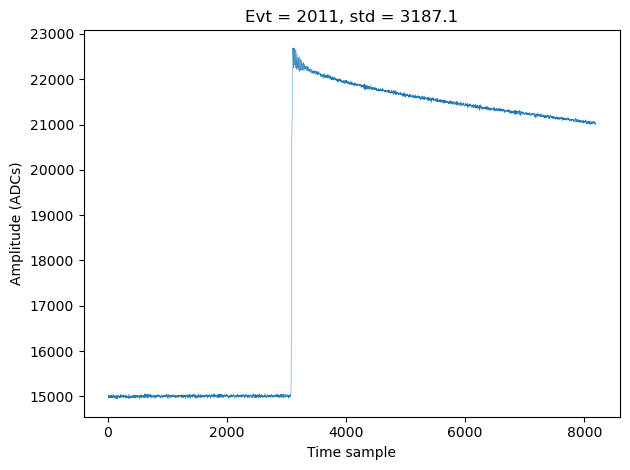

In [7]:
channel = 'ch1104000'
store   = LH5Store() 
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

plt.figure(figsize=(6, 4))
for i in range(len(data_raw.values)):
    wf = data_raw.values[i]
    if np.std(wf)>22:
        plt.plot(np.arange(len(wf)), wf, linewidth=0.3)
        plt.title(f'Evt = {i}, std = {np.round(np.std(wf), 2)}')
        plt.xlabel('Time sample')
        plt.ylabel('Amplitude (ADCs)')
        plt.tight_layout()
        plt.show()

### Data selection

- 22 < Std < 100
- Max - Min < 250
- Slope > 0
- Mean > 14800

In [11]:
from sklearn.linear_model import LinearRegression

def calculate_baseline_slope(waveform):
    x = range(len(waveform))  # Time or sample index
    x = np.array(x).reshape(-1, 1)  # Reshape for regression
    y = waveform  # Baseline waveform values

    model = LinearRegression()
    model.fit(x, y)

    baseline_slope = model.coef_[0]
    return baseline_slope

def string_stats(waveform, units='ADCs', ndec=2):
    std_str     = f'Std   = {np.round(np.std(waveform), ndec)} {units}'
    mean_str    = f'Mean  = {np.round(np.mean(waveform), ndec)} {units}'
    mode_str    = f'Mode  = {np.round(st.mode(waveform, keepdims=False).mode, ndec)} {units}'
    slope_str   = f'Slope = {np.round(calculate_baseline_slope(waveform), 5)} {units}'
    max_min_str = f'Max - Min = {np.round(np.max(waveform)-np.min(waveform), ndec)} {units}'
    return f'{std_str}'+'\n'+f'{mean_str}'+'\n'+f'{mode_str}'+'\n'+f'{slope_str}'+'\n'+f'{max_min_str}'

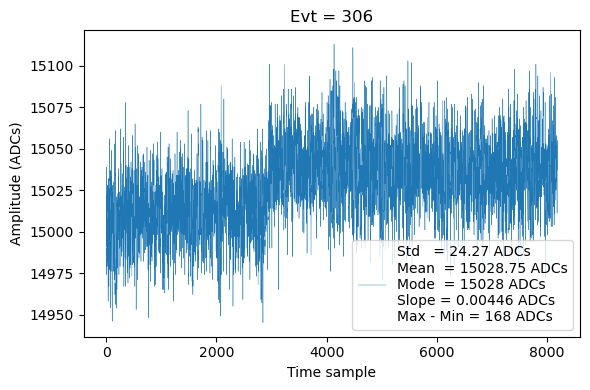

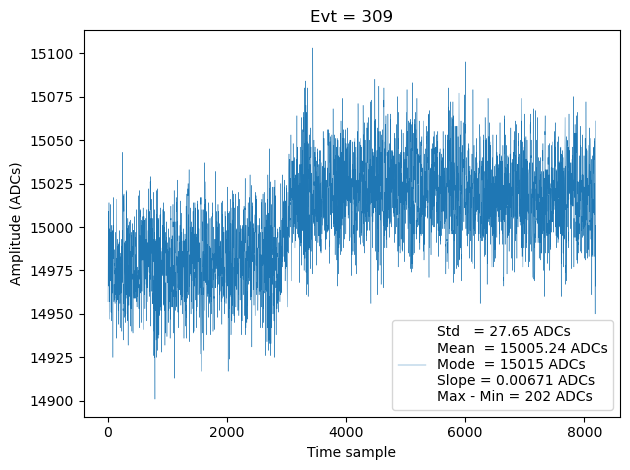

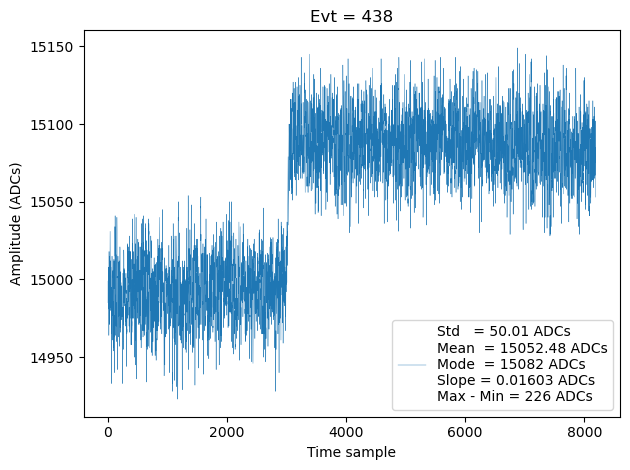

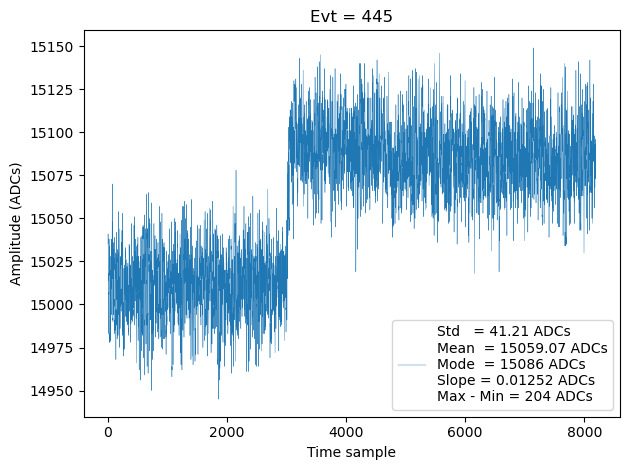

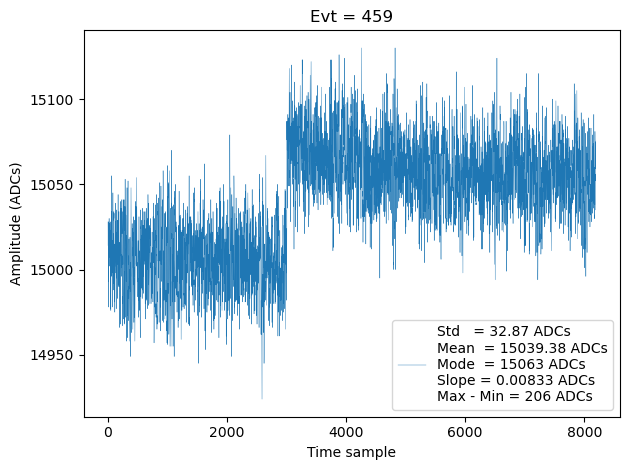

...

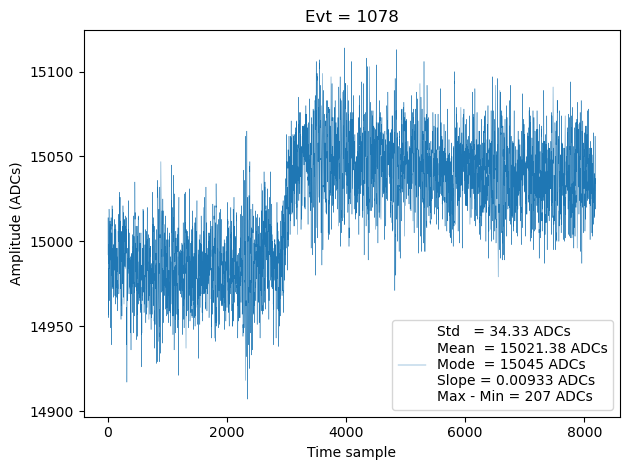

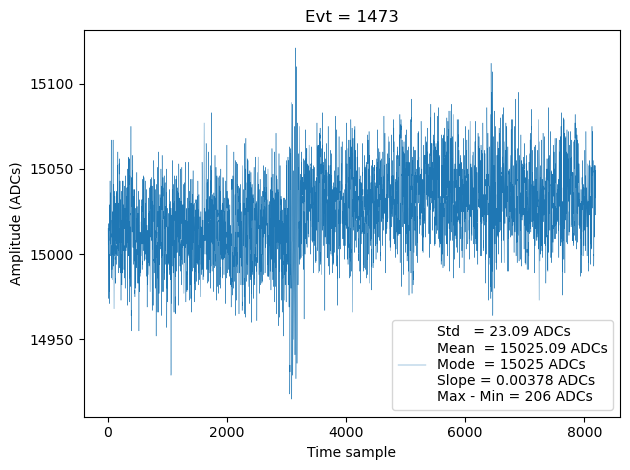

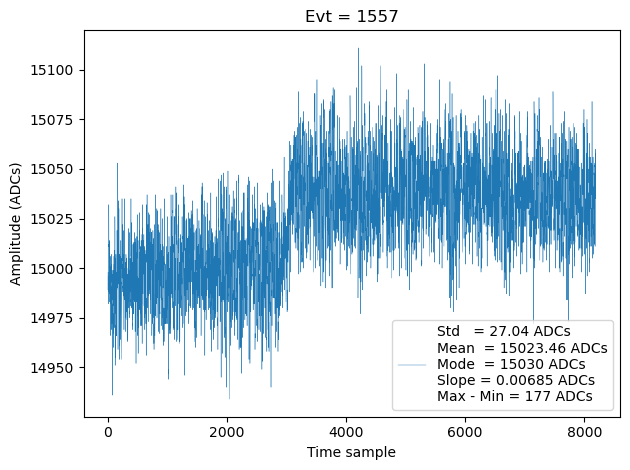

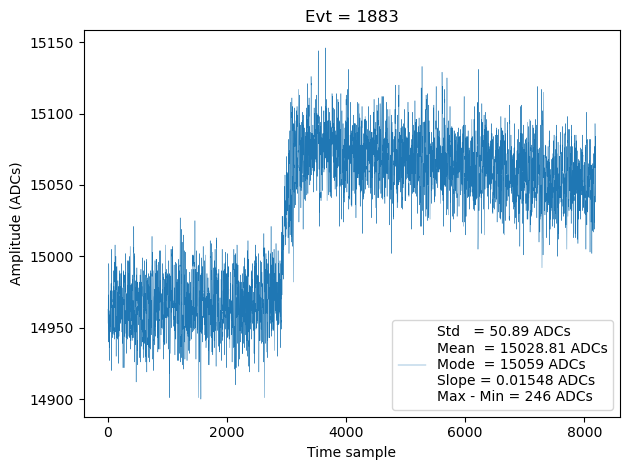

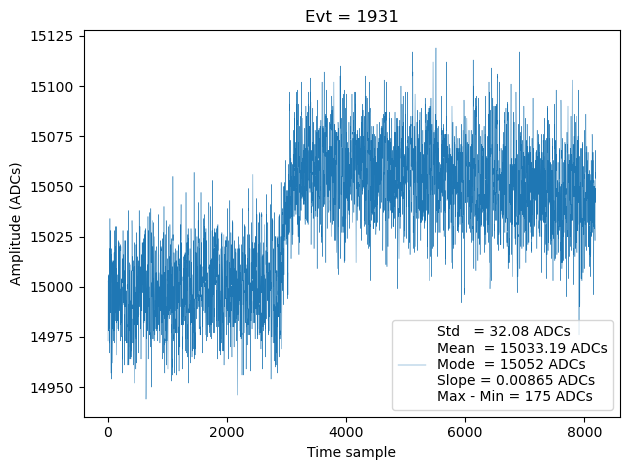

In [12]:
channel = 'ch1104000'
store   = LH5Store() 
data_raw, n_tot = store.read_object(f'{channel}/raw/waveform', wf_file, n_rows=np.inf)

plt.figure(figsize=(6, 4))
for i in range(len(data_raw.values)):
    wf = data_raw.values[i]
    if np.std(wf)>22 and np.std(wf)<100:
        slope = calculate_baseline_slope(wf)
        if slope > 0:
            max_min = np.max(wf) - np.min(wf)
            if max_min < 250:
                if np.mean(wf)>14800:
                    plt.plot(np.arange(len(wf)), wf, linewidth=0.3, label=string_stats(wf))
                    plt.title(f'Evt = {i}')
                    plt.xlabel('Time sample')
                    plt.ylabel('Amplitude (ADCs)')
                    plt.legend()
                    plt.tight_layout()
                    plt.show()